In [1]:
from generate_grid_and_area import grid_and_area
import os
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap
import pandas as pd
%matplotlib inline

In [41]:
home_dir = os.getcwd()
data_dir = home_dir+'/data/'
no_snow_planet_name = 'dry_planet_24km.asc'
lat_grid_filename = 'imslat_24km.bin'
lon_grid_filename = 'imslon_24km.bin'
lat_long_area_filename = 'lat_long_area.csv'
lat_long_coords = {'lower_lat':25,'upper_lat':45,'lower_long':65,'upper_long':105} #set as lower and upper bounds for lat and long
grid_size = 1024

grid_maker = grid_and_area(lat_long_coords,data_dir,no_snow_planet_name,grid_size)
grid_maker.addLatLong(lat_grid_filename,lon_grid_filename)
grid_maker.reduceLatLong()
grid_maker.makeNoSnowMap()

#tibet falls approximatly in this region.
grid_maker.addAreas()


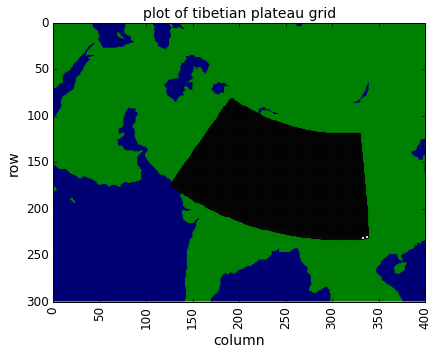

In [42]:
#%% Figure1
#zoom-in-area
zoom = (600,900,200,600)
backdrop = grid_maker.rbg_no_snow_matrix[zoom[0]:zoom[1],zoom[2]:zoom[3],:]
#plot of points of interest
llm = np.matrix(grid_maker.lat_long_indicies)
llm_x = llm[:,1] - zoom[2]
llm_y = (llm[:,0]-zoom[0])

# Two subplots, the axes array is 1-d
fig1 = plt.figure(1, figsize = (8,5))

label_fontsize = 14
ax1 = plt.axes()
plt.setp(ax1.get_xticklabels(), rotation='vertical',fontsize=12)
plt.setp(ax1.get_yticklabels(), fontsize=12)


#plt.figure(1, figsize=(12,5))
#ax1 = plt.subplot(1,2,1)
ax1.imshow(backdrop)
ax1.set_title('plot of tibetian plateau grid',fontsize=label_fontsize)
ax1.set_xlabel('column',fontsize=label_fontsize)
ax1.set_ylabel('row',fontsize=label_fontsize)


ax1.scatter(llm_x,llm_y, c='w', s=10, marker = 'o')


ax1.axis([0,400,300,0])



plt.show()

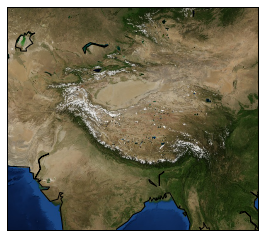

In [4]:
#make map
plt.figure(2)
center = ((lat_long_coords['upper_long']-lat_long_coords['lower_long'])/2+lat_long_coords['lower_long'],(lat_long_coords['upper_lat']-lat_long_coords['lower_lat'])/2+lat_long_coords['lower_lat'])

m = Basemap(projection='laea',
            width = 4500000,
            height = 4000000,
            resolution='c',lat_0=center[1],lon_0=center[0])
#draw coastlines.
m.drawcoastlines()
# draw a boundary around the map, fill the background.
# this background will end up being the ocean color, since
# the continents will be drawn on top.
m.drawmapboundary(fill_color='None')
# fill continents, set lake color same as ocean color.
m.fillcontinents(color='None',lake_color='None')
m.bluemarble()
plt.show()

In [6]:
from plotly.offline import download_plotlyjs, init_notebook_mode, iplot
import plotly.graph_objs as go
init_notebook_mode()

df = grid_maker.df
scl = [ [0,"rgb(5, 10, 172)"],[0.35,"rgb(40, 60, 190)"],[0.5,"rgb(70, 100, 245)"],\
    [0.6,"rgb(90, 120, 245)"],[0.7,"rgb(106, 137, 247)"],[0,"rgb(220, 220, 220)"] ]
trace = go.Scattergl(
        x = df['long'],
        y = df['lat'],
        text = df['area'],
        mode = 'markers',
        marker = dict( 
            size = 8, 
            opacity = 0.8,
            reversescale = True,
            autocolorscale = False,
            symbol = 'square',
            line = dict(
                width=1,
                color='rgba(102, 102, 102)'),
            colorscale = scl,
            cmin = df['area'].min(),
            color = df['area'],
            cmax = df['area'].max(),
            colorbar=dict(
                title="Km^2")
            )
        )

data = [trace]
layout = dict(
        title = 'Areas of Tibet Grid',
        colorbar = True,  
        xaxis=dict(
        title='Longitude',
        titlefont=dict(
            family='Courier New, monospace',
            size=20
        ),
        ),
        yaxis=dict(
            title='Latitude',
            titlefont=dict(
                family='Courier New, monospace',
                size=20
            ),
        ),
            )
    

fig = dict( data=data, layout=layout )
plot_url = iplot(fig, validate=False)

In [100]:
home_dir = os.getcwd()
data_dir = home_dir+'/data/'
no_snow_planet_name = 'dry_planet_24km.asc'
lat_grid_filename = 'imslat_24km.bin'
lon_grid_filename = 'imslon_24km.bin'
lat_long_area_filename = 'lat_long_area.csv'
lat_long_coords = {'lower_lat':35,'upper_lat':36,'lower_long':85,'upper_long':86} #set as lower and upper bounds for lat and long
grid_size = 1024
grid_maker = grid_and_area(lat_long_coords,data_dir,no_snow_planet_name,grid_size)
grid_maker.addLatLong(lat_grid_filename,lon_grid_filename)
grid_maker.reduceLatLong()
grid_maker.makeNoSnowMap()

grid_maker.addAreas()
df = grid_maker.df
df.reset_index(level = df.index.names, inplace=True)

In [101]:
from plotly.offline import download_plotlyjs, init_notebook_mode, iplot
from plotly.graph_objs import *
init_notebook_mode()

scl = [ [0,"rgb(5, 10, 172)"],[0.35,"rgb(40, 60, 190)"],[0.5,"rgb(70, 100, 245)"],\
    [0.6,"rgb(90, 120, 245)"],[0.7,"rgb(106, 137, 247)"],[0,"rgb(220, 220, 220)"] ]

def make_area_text(X):
    return 'Area: %s km^2\
    <br>row: %s\
    <br>column: %s'\
    % (round(X['area'],2), X['row'], X['col'])  
    
def make_centroids_text(X):
    return 'row: %s\
    <br>column: %s'\
    % (X['row'], X['col'])  

centroid_df = df[df['col'] < 765]
area_df = centroid_df[centroid_df['col'] > 760]
centroid_df = centroid_df[ centroid_df['row'] > 444]
area_df = area_df[ area_df['row'] > 445]

trace0 = Scatter(
    name = 'grid points',
    y=area_df['lat'],
    x=area_df['long'],
    mode = 'markers',
    text =df.apply(lambda x: make_area_text(x), axis=1),
    marker = dict( 
        size = 8, 
        opacity = 0.8,
        reversescale = True,
        autocolorscale = False,
        showscale=True,
        symbol = 'square',
        line = dict(
            width=1,
            color='rgba(102, 102, 102)'),
        colorscale = scl,
        cmin = df['area'].min(),
        color = df['area'],
        cmax = df['area'].max(),
        colorbar=dict(
            title="Km^2")
        )
    )
trace1 = Scatter(
    name = 'cell corners',
    y=centroid_df['centroid_lat'],
    x=centroid_df['centroid_long'],
    #text = df[ ['row', 'col']].values,
    #text = df['row'],
    text = centroid_df.apply(lambda x: make_centroids_text(x), axis = 1),
    mode = 'markers',
    #hoverinfo = "none",
)


def get_centroid_coords(area_indexes, centroid_df):
    coords = []    
    df = centroid_df.set_index(['col', 'row'])[ ['centroid_lat', 'centroid_long'] ]
    for idx in area_indexes:
        col, row = idx
        item = [(df.ix[ (col-1,row)]['centroid_long'], df.ix[ (col-1,row)]['centroid_lat']),
                (df.ix[ (col,row)]['centroid_long'], df.ix[ (col,row)]['centroid_lat']),
                (df.ix[ (col,row-1)]['centroid_long'], df.ix[ (col,row-1)]['centroid_lat']),
                (df.ix[ (col-1,row-1)]['centroid_long'], df.ix[ (col-1,row-1)]['centroid_lat'])]
        coords.append(item)
    coords = np.array(coords)  
    return coords
#get col and row indexes from area_df
area_indexes = area_df[['col', 'row']].values
#return a list containing the centroid coordinates
centroid_polygons = get_centroid_coords(area_indexes, centroid_df)

#make polygon traces out of each centroid_polygons
def make_scatter(x,y):
    return Scatter(
        x=np.append(x,x[0]),
        y=np.append(y,y[0]),
        name = 'cell boundary',
        mode='lines',
        line=dict(
        color='rgba(143, 19, 131, .5)',
        ),
        fill='none',
        fillcolor = "none",
        showlegend=False,
        hoverinfo = "none"
        )


traces= list(map( lambda pt: make_scatter(pt[:,0], pt[:,1]), centroid_polygons))
traces[0]['showlegend'] = True
traces.append(trace0)
traces.append(trace1)
data = Data(traces)


layout = dict(

    title='Section of map grid showing areas',

    xaxis=dict(
        title='Longitude',
        titlefont=dict(
            family='Courier New, monospace',
            size=18
        ),
    ),
    yaxis=dict(
        title='Latitude',
        titlefont=dict(
            family='Courier New, monospace',
            size=18
        ),
    ),
    legend=dict(
        x = .82,
        y = 1),
        #orientation= "h"),
    
    hovermode='closest'
    )
    
    
fig = {
    'data': data,
    'layout': layout,
}

iplot(fig, filename = 'grid')

In [107]:
def make_annotation(x,y,snow_bool):

    if snow_bool:
        text = '1'
    else:
        text = '0'

    annotation = dict(
            x=x,
            y=y,
            xref='x',
            yref='y',
            text=text,
        )
    return annotation

fig2 = fig
snow_bools = [True] * 5 + [False] * 15   
annotations = list(map( lambda pt: make_annotation(pt[0], pt[1], False), area_df[['long', 'lat']].values))
fig2['layout']['annotations'] = annotations


def make_poly(x,y, snow_bool):
     # filled Polygon

    if snow_bool:
        color = 'rgba(5,5,5,.5)'
    else:
        color = 'rgba(0,128,0,.5)'
    
    shape = {
        'type': 'path',
        'path': ' M'+str(x[0])+','+str(y[0])+'L'+str(x[1])+','+str(y[1])+'L'+str(x[2])+','+str(y[2])+'L'+str(x[3])+','+str(y[3])+'Z',
        'fillcolor': color,
        'line': {
            'color': color,
        },
    }
    
    return shape

def get_centroid_coords(area_indexes, centroid_df):
    coords = []    
    snow_bool = [True] * 10 + [False] * 10
    df = centroid_df.set_index(['col', 'row'])[ ['centroid_lat', 'centroid_long'] ]
    for idx in area_indexes:
        col, row = idx
        item = [(df.ix[ (col-1,row)]['centroid_lat'], df.ix[ (col-1,row)]['centroid_long']),
                (df.ix[ (col,row)]['centroid_lat'], df.ix[ (col,row)]['centroid_long']),
                (df.ix[ (col,row-1)]['centroid_lat'], df.ix[ (col,row-1)]['centroid_long']),
                (df.ix[ (col-1,row-1)]['centroid_lat'], df.ix[ (col-1,row-1)]['centroid_long'])]
        coords.append(item)
    coords = np.array(coords)  
    return coords

#get col and row indexes from area_df
area_indexes = area_df[['col', 'row']].values
#return a list containing the centroid coordinates
centroid_polygons = get_centroid_coords(area_indexes, centroid_df)


poly_traces = list(map( lambda pt: make_poly(pt[:,1], pt[:,0], False), centroid_polygons))
                
for i, snow_bool in enumerate(snow_bools):
    if snow_bool:
        poly_traces[i]['fillcolor'] = 'rgba(255,255,255,.5)'
        poly_traces[i]['line']['color'] = 'rgba(255,255,255,.5)'
        annotations[i]['text'] = '1'

fig2['layout']['annotations'] = annotations
fig2['layout']['shapes'] = poly_traces
              
#fig['layout'].update(traces=traces)
iplot(fig2, filename = 'grid',validate=False)

In [104]:
area_df

,col,row,lat,long,noSnowMap,noSnowMapRBG,centroid_lat,centroid_long,x,y,area
5,761,446,35.711994,85.368942,2,"[0, 128, 0]",35.6472,85.5046,2295593.873084,2072081.471408,404.044762
6,761,447,35.757336,85.584572,2,"[0, 128, 0]",35.6921,85.72,2315026.148019,2077193.891560,404.378051
7,761,448,35.802036,85.800621,2,"[0, 128, 0]",35.7364,85.9359,2334473.803634,2082277.461900,404.697220
9,762,446,35.537201,85.424965,2,"[0, 128, 0]",35.4724,85.56,2300713.551279,2052671.808218,402.779250
10,762,447,35.582302,85.639839,2,"[0, 128, 0]",35.5171,85.7747,2320117.253110,2057768.312362,403.111421
11,762,448,35.626762,85.855133,2,"[0, 128, 0]",35.5611,85.9898,2339536.333475,2062835.944814,403.427194
14,763,446,35.362633,85.480576,2,"[0, 128, 0]",35.2978,85.6151,2305817.243290,2033290.097355,401.522867
15,763,447,35.407497,85.694702,2,"[0, 128, 0]",35.3423,85.829,2325192.287208,2038370.753223,401.850494
16,763,448,35.451725,85.909233,2,"[0, 128, 0]",35.3861,86.0434,2344582.702283,2043422.516716,402.164329
19,764,446,35.188297,85.535774,2,"[0, 128, 0]",35.1235,85.6697,2310904.211824,2013936.645497,400.261005


In [82]:
[True] * 10 + [False] * 10

[True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False]

In [76]:
poly = make_poly(centroid_polygons[0][:,0],centroid_polygons[0][:,1],False)
fig2 = fig
fig2['layout']['shapes'] = [poly]
iplot(fig2, filename = 'grid',validate=False)

In [9]:
from plotly.offline import download_plotlyjs, init_notebook_mode, iplot
from plotly.graph_objs import *
init_notebook_mode()

df.reset_index(level = df.index.names, inplace=True)
scl = [ [0,"rgb(5, 10, 172)"],[0.35,"rgb(40, 60, 190)"],[0.5,"rgb(70, 100, 245)"],\
    [0.6,"rgb(90, 120, 245)"],[0.7,"rgb(106, 137, 247)"],[0,"rgb(220, 220, 220)"] ]
data = [ dict(
        type = 'scattergeo',
        lon = df['long'],
        lat = df['lat'],
        text = df['area'].map(lambda x: round(x,2)),
        mode = 'markers',
        marker = dict( 
            size = 8, 
            opacity = 0.8,
            reversescale = True,
            autocolorscale = False,
            symbol = 'square',
            line = dict(
                width=1,
                color='rgba(102, 102, 102)'),
            colorscale = scl,
            cmin = df['area'].min(),
            color = df['area'],
            cmax = df['area'].max(),
            colorbar=dict(
                title="Km^2")
        ))]


layout = dict(
        title = 'Areas of Tibet Grid',
        colorbar = True,   
        geo = dict(
            scope='world',
            projection=dict(rotation={"lon": -170}, type="conic equal area" ),
            lataxis =  dict(range = [34, 37]), 
            lonaxis = dict(range = [84, 87]),
            showland = True,
            landcolor = "rgb(250, 250, 250)",
            subunitcolor = "rgb(217, 217, 217)",
            countrycolor = "rgb(217, 217, 217)",
            countrywidth = 0.5,
            subunitwidth = 0.5        
        ),
    )

fig = dict( data=data, layout=layout )
plot_url = iplot(fig, validate=False)

In [38]:
print 'hello'

hello


In [39]:
   

def get_centroid_coords(area_indexes, centroid_df):
    coords = []    
    df = centroid_df.set_index(['col', 'row'])[ ['centroid_lat', 'centroid_long'] ]
    for idx in area_indexes:
        col, row = idx
        item = [(df.ix[ (col-1,row)]['centroid_long'], df.ix[ (col-1,row)]['centroid_lat']),
                (df.ix[ (col,row)]['centroid_long'], df.ix[ (col,row)]['centroid_lat']),
                (df.ix[ (col,row-1)]['centroid_long'], df.ix[ (col,row-1)]['centroid_lat']),
                (df.ix[ (col-1,row-1)]['centroid_long'], df.ix[ (col-1,row-1)]['centroid_lat'])]
        coords.append(item)
    coords = np.array(coords)  
    return coords
#get col and row indexes from area_df
area_indexes = area_df[['col', 'row']].values
#return a list containing the centroid coordinates
centroid_polygons = get_centroid_coords(area_indexes, centroid_df)

#make polygon traces out of each centroid_polygons
def make_scatter(x,y):
    return Scatter(
        x=np.append(x,x[0]),
        y=np.append(y,y[0]),
        name = 'cell boundary',
        mode='lines',
        line=dict(
        color='rgba(143, 19, 131, .5)',
        ),
        fill='none',
        fillcolor = "none",
        showlegend=False,
        hoverinfo = "none"
        )


traces= list(map( lambda pt: make_scatter(pt[:,0], pt[:,1]), centroid_polygons))
traces[0]['showlegend'] = True
traces.append(trace0)
traces.append(trace1)
data = Data(traces)



layout = dict(

    title='Section of map grid showing areas',

    xaxis=dict(
        title='Longitude',
        titlefont=dict(
            family='Courier New, monospace',
            size=18
        ),
    ),
    yaxis=dict(
        title='Latitude',
        titlefont=dict(
            family='Courier New, monospace',
            size=18
        ),
    ),
    legend=dict(
        orientation= "h"),
    
    hovermode='closest'
    )
    
    
fig = {
    'data': data,
    'layout': layout,
}

iplot(fig, filename = 'grid')


In [20]:
traces[0]['showlegend'] = True
traces[0]
#centroid_polygons[0]
#traces[0]
#layout
#' M'+str(x[0])+','+str(y[0])+'L'+str(x[1])+','+str(y[1])+'L'+str(x[2])+','+str(y[2])+'L'+str(x[3])+','+str(y[3])+'Z',

{'fill': 'none',
 'fillcolor': 'none',
 'hoverinfo': 'none',
 'line': {'color': 'rgba(143, 19, 131, .5)'},
 'mode': 'lines',
 'showlegend': True,
 'type': 'scatter',
 'x': array([ 85.44872284,  85.50457954,  85.28954124,  85.23292732,  85.44872284]),
 'y': array([ 35.82223892,  35.64720821,  35.60166836,  35.77645588,  35.82223892])}

In [149]:
def get_centroid_coords(area_indexes, centroid_df):
    coords = []    
    df = centroid_df.set_index(['col', 'row'])[ ['centroid_lat', 'centroid_long'] ]
    for idx in area_indexes:
        col, row = idx
        item = [(df.ix[ (col-1,row)]['centroid_lat'], df.ix[ (col-1,row)]['centroid_long']),
                (df.ix[ (col,row)]['centroid_lat'], df.ix[ (col,row)]['centroid_long']),
                (df.ix[ (col,row-1)]['centroid_lat'], df.ix[ (col,row-1)]['centroid_long']),
                (df.ix[ (col-1,row-1)]['centroid_lat'], df.ix[ (col-1,row-1)]['centroid_long'])]
        coords.append(item)
    coords = np.array(coords)  
    return coords
#get col and row indexes from area_df
area_indexes = area_df[['col', 'row']].values
#return a list containing the centroid coordinates
centroid_polygons = get_centroid_coords(area_indexes, centroid_df)

#make polygon traces out of each centroid_polygons
def make_scatter(x,y):
    return Scatter(
        x=np.append(x,x[0]),
        y=np.append(y,y[0]),
        mode='lines',
        line=dict(
        color='rgb(143, 19, 131)',
        ),
        opacity = .5,
        #line=Line(color="black"),
        fill='tonexty',
        #fillcolor = color,
        name=' '  # no name on hover
        )
def make_poly(x,y):
     # filled Polygon
    shape = {
        'type': 'path',
        'path': ' M'+str(x[0])+','+str(y[0])+'L'+str(x[1])+','+str(y[1])+'L'+str(x[2])+','+str(y[2])+'L'+str(x[3])+','+str(y[3])+'Z',
        'fillcolor': 'rgba(255, 140, 184, 0.5)',
        'line': {
            'color': 'rgb(255, 140, 184)',
        },
    }
    
    return shape

#traces = list(map(lambda row: make_scatter(row[:,0],row[:,1]), centroid_polygons))
traces = []
traces= list(map( lambda pt: make_scatter(pt[:,0], pt[:,1]), centroid_polygons))
traces.append(trace0)
#traces.append(trace1)
data = Data(traces)


test = {
            'type': 'path',
            'path': ' M 3,7 L2,8 L2,9 L3,10, L4,10 L5,9 L5,8 L4,7 Z',
            'fillcolor': 'rgba(255, 140, 184, 0.5)',
            'line': {
                'color': 'rgb(255, 140, 184)',
            },
        }

x,y = centroid_polygons[0][:,0],centroid_polygons[0][:,1]

test2 ={
            'type': 'path',
            'path': ' M'+str(x[0])+','+str(y[0])+'L'+str(x[1])+','+str(y[1])+'L'+str(x[2])+','+str(y[2])+'L'+str(x[3])+','+str(y[3])+'Z',
            'fillcolor': 'rgba(255, 140, 184, 0.5)',
            'opacity':'.5',
            'line': {
                'color': 'rgb(255, 140, 184)',
        },
        }

#layout = {'shapes': [make_poly(centroid_polygons[0][:,0],centroid_polygons[0][:,1]),test]}
layout = {'shapes': [test2]}

fig = {
    'data': data,
    'layout': layout,
}
iplot(fig, filename = 'basic-line')


In [72]:
#df.set_index(['col', 'row'], inplace = True)
df.reset_index(level = df.index.names, inplace=True)

#df.loc[ df.index != (765,447) ]

#df.select(lambda row: row[0:1] != ('765','447'), axis=0)
#df.ix[(765,447)]
#df.drop(  '447', level = '765' )

In [27]:
from plotly.offline import download_plotlyjs, init_notebook_mode, iplot
from plotly.graph_objs import as go
init_notebook_mode()

df = grid_maker.df
scl = [ [0,"rgb(5, 10, 172)"],[0.35,"rgb(40, 60, 190)"],[0.5,"rgb(70, 100, 245)"],\
    [0.6,"rgb(90, 120, 245)"],[0.7,"rgb(106, 137, 247)"],[0,"rgb(220, 220, 220)"] ]
trace = [ dict(
        type = 'scattergeo',
        lon = df['long'],
        lat = df['lat'],
        text = df['area'],
        mode = 'markers',
        marker = dict( 
            size = 8, 
            opacity = 0.8,
            reversescale = True,
            autocolorscale = False,
            symbol = 'square',
            line = dict(
                width=1,
                color='rgba(102, 102, 102)'),
            colorscale = scl,
            cmin = df['area'].min(),
            color = df['area'],
            cmax = df['area'].max(),
            colorbar=dict(
                title="Km^2")
        ))]


layout = dict(
        title = 'Areas of Tibet Grid',
        colorbar = True,   
        geo = dict(
            scope='world',
            projection=dict(rotation={"lon": -170}, type="conic equal area" ),
            lataxis =  dict(range = [25, 45]), 
            lonaxis = dict(range = [55, 105]),
            showland = True,
            landcolor = "rgb(250, 250, 250)",
            subunitcolor = "rgb(217, 217, 217)",
            countrycolor = "rgb(217, 217, 217)",
            countrywidth = 0.5,
            subunitwidth = 0.5        
        ),
    )

fig = dict( data=data, layout=layout )
plot_url = iplot(fig, validate=False)